<a href="https://colab.research.google.com/github/BaruBenoni/DogRecognition/blob/main/dog_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive
#drive.mount("/content/drive", force_remount=True


In [ ]:
#!pip install kaggle

In [ ]:
#%cd /content/drive/MyDrive/DogRecognition

In [ ]:
#import os
#os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/DogRecognition/"


In [ ]:
#!kaggle competitions download -c dog-breed-identification

In [ ]:
#ls

In [ ]:
#!unzip "/content/drive/MyDrive/DogRecognition/dog-breed-identification.zip" -d "/content/drive/MyDrive/DogRecognition/"

In this project is used machine learning to help identify different breeds of dogs.

I am using data from the [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview). It consists of a collection of 10000 labelled images of 120 different dog breeds.

In [2]:
# Import TensorFlow into Colab
import tensorflow as tf
print ("TF version", tf.__version__)

TF version 2.14.0


In [3]:
import tensorflow_hub as hub
print ("TF Hub version", hub.__version__)

TF Hub version 0.15.0


In [4]:
# Check for GPU availibility
print ("GPU", "available, hurray!" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available, hurray!


In [ ]:
#!ls

In [ ]:
# Check out the labels of our data.
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DogRecognition/labels.csv")

print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
#labels_csv.head()

In [ ]:
from IPython.display import Image

### Getting images and their labels

In [ ]:
# Create pathnames from image's ID

filenames = ["drive/MyDrive/DogRecognition/train/" + fname + ".jpg" for fname in labels_csv["id"]]


In [ ]:
# Check that I have the same amount of filenames and actual image files

import os
if len(os.listdir("drive/MyDrive/DogRecognition/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed.")
else:
  print("Filenames do not match actual amoutn of files, check the target directory")


Filenames match actual amount of files! Proceed.


In [ ]:
labels_csv["breed"][:10]

0           boston_bull
1                 dingo
2              pekinese
3              bluetick
4      golden_retriever
5    bedlington_terrier
6    bedlington_terrier
7                borzoi
8               basenji
9    scottish_deerhound
Name: breed, dtype: object

In [ ]:

import numpy as np
labels = labels_csv["breed"].to_numpy()
labels[:10]


array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
# Find unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
# Set nuber of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label,
  processes the image and returns a tuple of **image, label**.
  """
  image = process_image(image_path)
  return image, label

In [ ]:
BATCH_SIZE = 32

# Function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print("Creating test data batches.")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches.")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches.")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))

    data = data.shuffle(buffer_size=len(x))

    data = data.map(get_image_label)

    data_batch = data.batch(BATCH_SIZE)
  return data_batch



In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches.
Creating validation data batches.


In [ ]:
# Check the different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

# Function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Dislays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots 5 rows, 5 columns
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off:
    plt.axis("off")

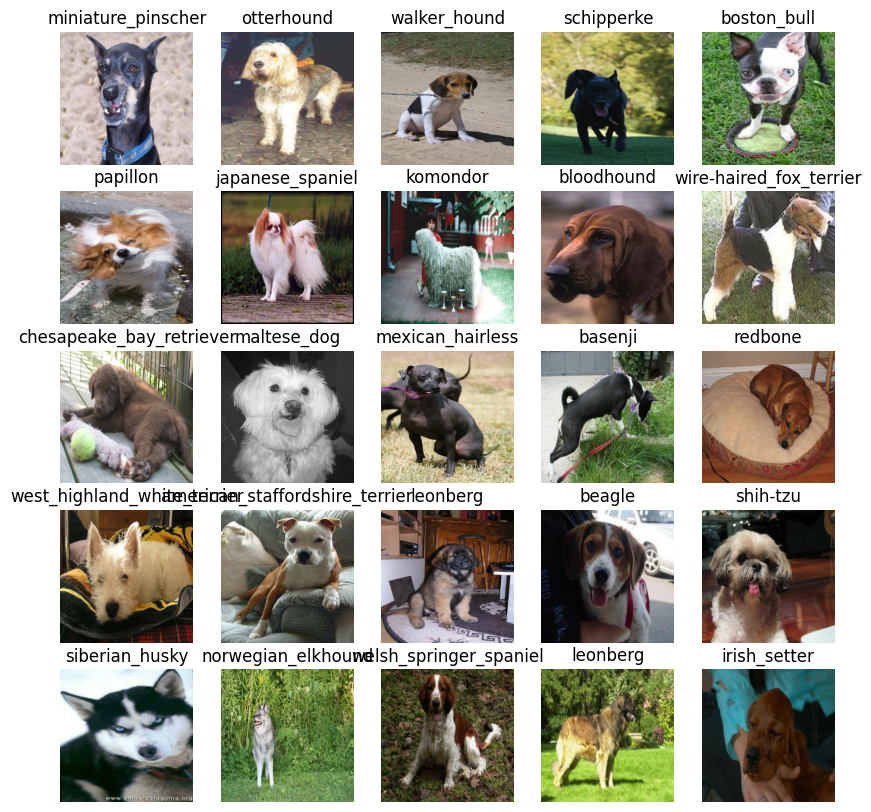

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)


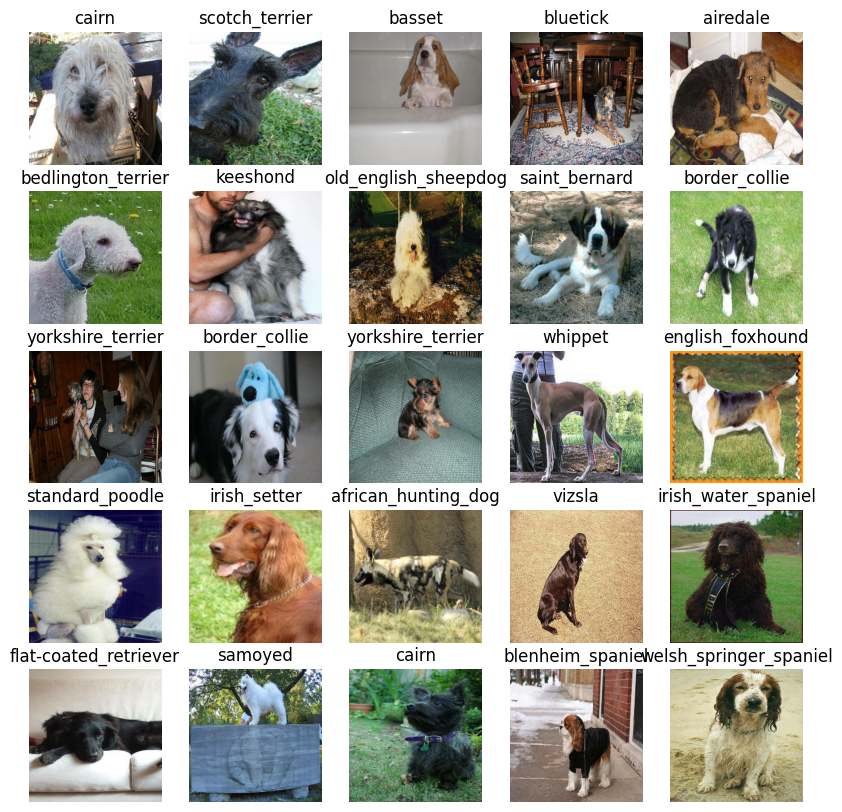

In [ ]:
# Visualize the validation set
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


In [ ]:
# Function for a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/DogRecognition/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (Hurray!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
#model = train_model()

In [ ]:
#!pip uninstall torch-tb-profiler
#!pip uninstall -y tensorboard tb-nightly &&
#!pip install tb-nightly  # must have at least tb-nightly==2.5.0a20210316
#!ls drive/MyDrive/DogRecognition/logs

In [ ]:
#!kill 14332
#%reload_ext tensorboard

#%tensorboard --logdir drive/MyDrive/DogRecognition/logs #--load_fast true


In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
#predictions = loaded_full_model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 17s 2s/step


array([[0.00442314, 0.00026979, 0.00206544, ..., 0.00204167, 0.02165257,
        0.00315514],
       [0.01392697, 0.0003542 , 0.00077441, ..., 0.00516758, 0.00180739,
        0.00462694],
       [0.00161483, 0.03131404, 0.02866008, ..., 0.00261776, 0.00108681,
        0.03061533],
       ...,
       [0.03653996, 0.00358595, 0.02191659, ..., 0.00924621, 0.01159173,
        0.00149073],
       [0.00714821, 0.00483357, 0.00248831, ..., 0.00438757, 0.00349288,
        0.02060025],
       [0.00730053, 0.00021505, 0.00192427, ..., 0.00672602, 0.00612073,
        0.01128471]], dtype=float32)

In [ ]:
# Check the shape of predictions
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label
print(f"Predicted label 2: {unique_breeds[predictions[0].argmax()]}") # the predicted label
print(f"Real label: {labels[0]}")


[6.73717921e-07 4.93969798e-09 6.70797320e-08 3.12113495e-11
 8.11678618e-08 6.55028289e-12 8.34812876e-04 1.32852573e-09
 1.34653910e-09 3.51353013e-09 4.70478270e-08 1.29968014e-09
 1.72805485e-08 5.27076750e-11 2.26473753e-11 9.06521294e-08
 2.28412365e-08 5.48289063e-05 3.24674836e-11 2.55063526e-10
 3.96235123e-07 6.28676056e-10 1.03011457e-08 7.36986408e-07
 3.04320848e-12 4.44871606e-09 9.91370082e-01 3.92864692e-08
 2.49974819e-09 2.72811129e-09 3.34267086e-10 1.32001441e-08
 1.46096095e-08 2.75389433e-10 1.11243209e-10 2.39330204e-03
 2.42841719e-10 1.35189693e-09 5.58478923e-11 1.31565758e-09
 1.56252383e-07 2.11591189e-09 2.01676165e-09 1.03753063e-12
 2.19572693e-09 7.99419109e-09 3.34881650e-10 6.19541822e-08
 5.21308374e-09 1.01886917e-08 1.02717364e-08 1.29051143e-08
 1.56127977e-09 4.81957869e-08 3.04151565e-11 1.93419013e-11
 1.89610958e-08 3.99575640e-07 3.99947103e-10 9.74014529e-06
 2.24425971e-08 1.37293857e-11 7.01469673e-07 3.22807142e-10
 3.21722232e-10 7.228441

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  #return unique_breeds[np.argmax(prediction_probabilities)]
  return unique_breeds[prediction_probabilities.argmax()]
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[19])
pred_label

'schipperke'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
    #labels.append(unique_breeds[np.argmax(label)])
    #labels.append(unique_breeds[labels[n].argmax()])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[1], val_labels[1]

(array([[[0.96018916, 0.97587544, 0.979797  ],
         [0.9617217 , 0.977408  , 0.98132956],
         [0.9651424 , 0.9808287 , 0.9847503 ],
         ...,
         [0.95294124, 0.9725491 , 0.9960785 ],
         [0.94906336, 0.9686712 , 0.9922006 ],
         [0.94802153, 0.9676294 , 0.9911588 ]],
 
        [[0.97587544, 0.9915617 , 0.9954833 ],
         [0.9765078 , 0.99219406, 0.9961156 ],
         [0.9802049 , 0.99589115, 0.99981266],
         ...,
         [0.96018916, 0.979797  , 1.        ],
         [0.9563113 , 0.9759191 , 0.9994114 ],
         [0.95366776, 0.9732756 , 0.99680495]],
 
        [[0.9686275 , 0.9843138 , 0.98823535],
         [0.9689829 , 0.98466915, 0.9885907 ],
         [0.972765  , 0.9884513 , 0.9923729 ],
         ...,
         [0.9677083 , 0.98731613, 1.        ],
         [0.9650211 , 0.9846289 , 1.        ],
         [0.9610995 , 0.98070735, 0.9960785 ]],
 
        ...,
 
        [[0.29487073, 0.40404442, 0.24774945],
         [0.13160652, 0.22889124, 0.11186

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=4):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], unique_breeds[labels[n].argmax()], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Here x and y ticks are empty lists, so it will return nothing, we don't want them.

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  #pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_prob, true_label = prediction_probabilities[n], unique_breeds[labels[n].argmax()]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


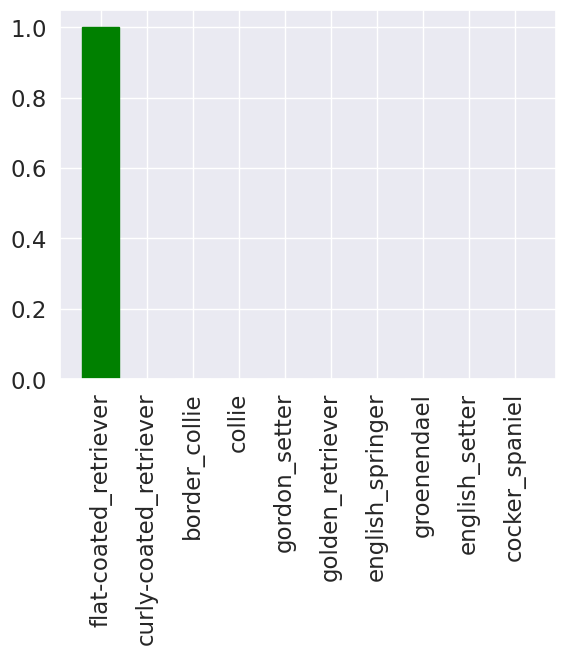

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=20)

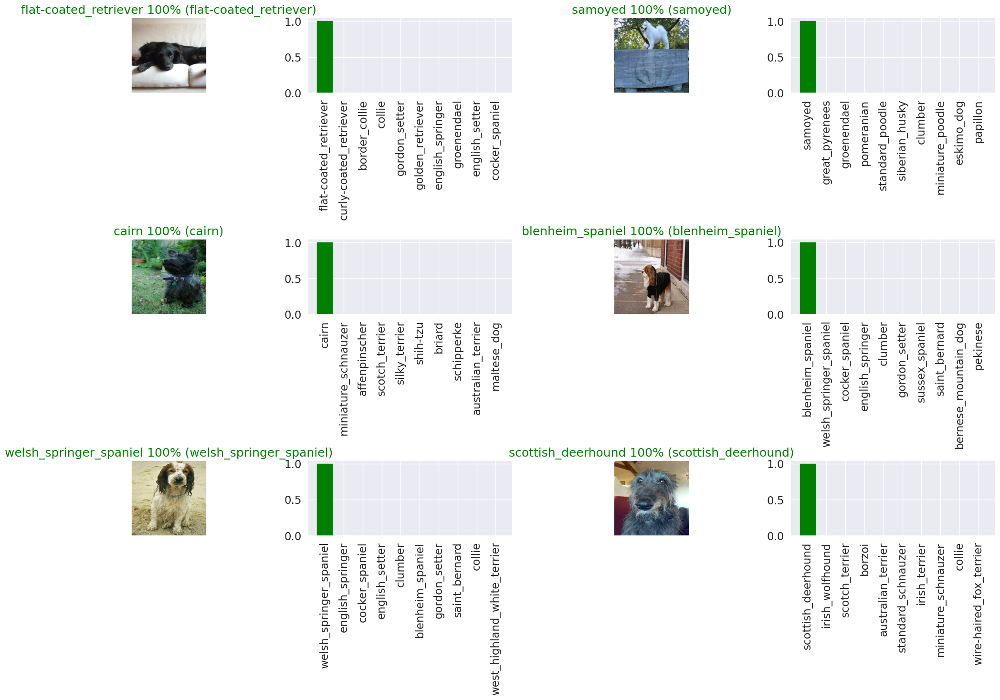

In [ ]:
# Few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/DogRecognition/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/DogVision/models/20231019-16331697733185-1000-images-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/models/20231019-16331697733185-1000-images-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/DogRecognition/models/20231019-16331697733185-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20231019-16331697733185-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 9s 1s/step - loss: 1.2977 - accuracy: 0.6450


[1.2977360486984253, 0.6449999809265137]

In [ ]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 1.2977 - accuracy: 0.6450


[1.2977360486984253, 0.6449999809265137]

## **Training a model on the full data**

In [ ]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches.


In [ ]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
%tensorboard --logdir drive/MyDrive/DogRecognition/logs

<IPython.core.display.Javascript object>

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 35s 93ms/step - loss: 1.3351 - accuracy: 0.6703
Epoch 2/100
320/320 [==============================] - 29s 92ms/step - loss: 0.4010 - accuracy: 0.8817
Epoch 3/100
320/320 [==============================] - 29s 91ms/step - loss: 0.2361 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 29s 91ms/step - loss: 0.1530 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 29s 90ms/step - loss: 0.1063 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0774 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0599 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0472 - accuracy: 0.9932
Epoch 9/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0375 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 29s 91ms/step - l

In [ ]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/MyDrive/DogVision/models/20231020-06291697783390-all-images-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/models/20231020-06291697783390-all-images-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/DogRecognition/models/20231020-06291697783390-all-images-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20231020-06291697783390-all-images-Adam.h5


In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/DogRecognition/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
# How many test images are there?
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches.


In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 530s 2s/step


In [ ]:
# Save prdictions (NumPy array) to csv file to access later
np.savetxt("drive/MyDrive/DogRecognition/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/DogRecognition/preds_array.csv", delimiter=",")

In [ ]:
# Check out the test predictions
test_predictions[:10]

array([[9.9995079e-10, 1.0184081e-12, 2.8112972e-09, ..., 2.0663478e-09,
        1.0210822e-05, 3.5841069e-08],
       [1.1163585e-06, 1.8622777e-06, 1.1767571e-08, ..., 2.3366171e-08,
        4.6590918e-09, 2.3455287e-09],
       [2.0804750e-10, 9.9140097e-12, 2.6412798e-12, ..., 8.1349379e-01,
        1.6390784e-09, 9.4813157e-11],
       ...,
       [4.8909636e-09, 7.2971811e-09, 3.7829075e-08, ..., 7.0378441e-09,
        1.2162948e-08, 1.7590979e-08],
       [3.0117142e-10, 1.6583112e-09, 1.5628099e-12, ..., 2.8825382e-13,
        3.6214627e-13, 2.7313977e-13],
       [1.0866155e-12, 1.0819247e-09, 2.3333964e-09, ..., 1.4341826e-11,
        7.5471926e-13, 1.1099545e-09]], dtype=float32)

### Preparing test dataset predictions for Kaggle


In [ ]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/DogRecognition/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de93f567cf5830e982182435db086b93,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3baf6b2914677edd2729db0f32e2620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e73dc6a8f2d7c941f28c0a5298bc5bdc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0a21cb0d8d3014b6c56230350a9362f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e66a91249a4979a86db48e5c64b81a88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de93f567cf5830e982182435db086b93,9.999508e-10,1.018408e-12,2.811297e-09,1.240486e-10,4.050902e-05,2.809128e-08,7.402767e-08,3.650830e-02,4.324019e-03,...,4.337545e-09,1.070529e-03,2.190446e-06,1.284149e-08,2.657351e-09,4.006005e-06,5.226926e-07,2.066348e-09,1.021082e-05,3.584107e-08
1,e3baf6b2914677edd2729db0f32e2620,1.116358e-06,1.862278e-06,1.176757e-08,2.633710e-07,3.213945e-07,4.440942e-08,5.212462e-10,8.119670e-10,1.806457e-10,...,8.166293e-04,1.837942e-09,2.039668e-07,9.324348e-07,7.652636e-08,1.069837e-11,5.800485e-11,2.336617e-08,4.659092e-09,2.345529e-09
2,e73dc6a8f2d7c941f28c0a5298bc5bdc,2.080475e-10,9.914010e-12,2.641280e-12,1.952181e-11,4.474446e-04,2.153570e-02,4.727851e-11,2.347527e-05,8.592688e-11,...,1.184367e-08,2.091206e-09,2.270679e-09,2.464072e-08,4.050863e-07,2.146226e-10,1.497885e-09,8.134938e-01,1.639078e-09,9.481316e-11
3,e0a21cb0d8d3014b6c56230350a9362f,2.763378e-06,1.954031e-08,1.037078e-10,8.382693e-14,3.159704e-10,3.010666e-10,2.431965e-12,2.484407e-10,8.306595e-11,...,1.730608e-08,1.508919e-08,4.411696e-13,1.611758e-10,5.288828e-09,9.129332e-10,2.605378e-08,1.721089e-10,7.315532e-14,3.145494e-11
4,e66a91249a4979a86db48e5c64b81a88,7.282140e-09,6.444722e-08,8.242039e-13,1.770990e-15,1.105107e-12,4.913815e-10,2.633979e-12,3.116908e-13,2.590950e-14,...,1.454455e-12,2.748815e-09,2.895415e-12,5.174897e-11,6.787794e-12,2.263226e-11,6.358303e-11,3.068229e-08,1.018082e-08,5.112332e-12


In [ ]:
preds_df.to_csv("drive/MyDrive/DogRecognition/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/DogRecognition/fun/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches.


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 57ms/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['greater_swiss_mountain_dog']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)